# Get the gradcam libraries

In [1]:
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 68.0 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 93.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 62.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 20.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 38.6 MB/s 

In [2]:
!pip install pytorch-gradcam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.0/6.0 MB 57.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pytorch-gradcam: filename=pytorch_gradcam-0.2.1-py3-none-any.whl size=5249 sha256=486054236851a8ddb1def0fa59830b308c25a14fd4e6d51f76ee280f59a33c76
  Stored in directory: /root/.cache/pip/wheels/20/d6/4e/1ac02c54faee563b4d06015456c6c5d85550dcec878740f37d
Successfully built pytorch-gradcam


In [62]:
# import necessary libraries
from PIL import Image
import torch
import torchvision.transforms as transforms
import torchvision.models as models
from pytorch_grad_cam import GradCAM
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image
import numpy as np
import matplotlib.pyplot as plt

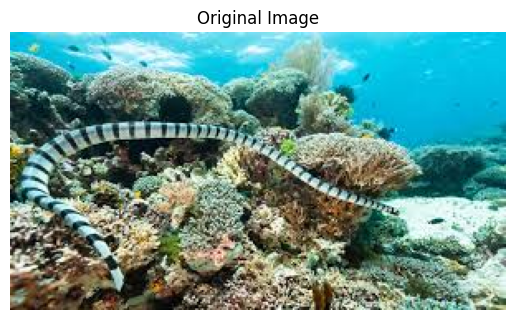

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [60]:
# Load and preprocess the image
image = Image.open('/content/sea snake.jpeg').convert('RGB')
plt.imshow(image)
plt.title("Original Image")
plt.axis('off')
plt.show()

# Define preprocessing transform for ResNet
transform = transforms.Compose([
    transforms.Resize(224),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])
x_orig = transform(image).unsqueeze(0)  # (1, 3, 224, 224)
x_adv = x_orig.clone().detach().requires_grad_(False)

# Load pretrained model
model = models.resnet18(pretrained=True).eval()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
x_adv = x_adv.to(device)
x_orig = x_orig.to(device)


We pass the original image through the model to get prediction probabilities, extract the top-5 predicted classes, and map their indices to human-readable labels from ImageNet. This helps verify what the model initially believes the image represents.

In [4]:
import urllib

# look at model outputs
with torch.no_grad():
    outputs = model(x_orig)
    probs = torch.nn.functional.softmax(outputs[0], dim=0)
    top5 = torch.topk(probs, 5)
print(top5)

#Get ImageNet label names
labels_url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
imagenet_labels = urllib.request.urlopen(labels_url).read().decode("utf-8").split("\n")

#what are the predicted labels
print("Top-5 Predictions:")
for idx in range(5):
    class_idx = top5.indices[idx].item()
    confidence = top5.values[idx].item()
    class_name = imagenet_labels[class_idx]
    print(f"{idx+1}. {class_name} ({confidence:.4f})")


torch.return_types.topk(
values=tensor([9.6419e-01, 2.5250e-02, 8.7924e-03, 7.1192e-04, 3.4075e-04],
       device='cuda:0'),
indices=tensor([ 65, 973, 390,   5, 392], device='cuda:0'))
Top-5 Predictions:
1. sea snake (0.9642)
2. coral reef (0.0253)
3. eel (0.0088)
4. electric ray (0.0007)
5. rock beauty (0.0003)


We unnormalize the input image, compute the Grad-CAM heatmap for the model's predicted class, and overlay it on the image to visualize which regions the model focuses on while making its decision.

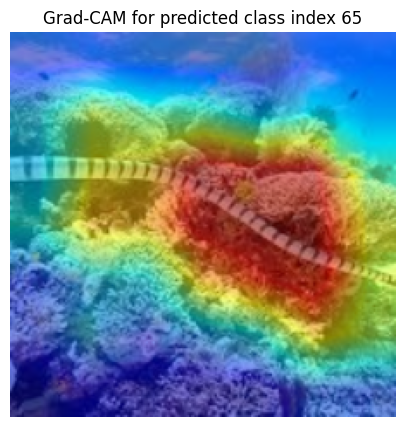

In [5]:
# unnormalising the image back regular rgb channels
def unnormalize(img_tensor):
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    return (img_tensor.squeeze().cpu() * std + mean).clamp(0, 1).permute(1, 2, 0).numpy()
input_rgb = unnormalize(x_orig)

with torch.no_grad():
    output = model(x_orig)
    pred_class = torch.argmax(output, dim=1).item()

from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
target_layers = [model.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layers)

# Compute CAM
targets = [ClassifierOutputTarget(pred_class)]
grayscale_cam = cam(input_tensor=x_orig, targets=targets)[0]  # (H, W)
cam_image = show_cam_on_image(input_rgb, grayscale_cam, use_rgb=True)

# Show Grad-CAM
plt.figure(figsize=(10, 5))
plt.imshow(cam_image)
plt.title(f"Grad-CAM for predicted class index {pred_class}")
plt.axis('off')
plt.show()


We predict the class of the adversarial image, compute its Grad-CAM heatmap, and create a normalized CAM mask. This mask highlights important regions for guiding patch-wise adversarial attacks.

In [6]:
# Predict target class
with torch.no_grad():
    pred_logits = model(x_adv)
    target_label = torch.argmax(pred_logits, dim=1).item()

# Compute Grad-CAM
target_layers = [model.layer4[-1]]
cam = GradCAM(model=model, target_layers=target_layers)
targets = [ClassifierOutputTarget(target_label)]
grayscale_cam = cam(input_tensor=x_adv, targets=targets)[0]  # (224, 224)

# Prepare cam_mask
cam_mask = torch.from_numpy(grayscale_cam).unsqueeze(0).unsqueeze(0).float().to(device)  # (1, 1, H, W)
cam_mask = cam_mask / cam_mask.max()


We define an objective function that outputs the softmax probability of the target class given an input. This guides the NES gradient estimation for generating adversarial examples.

In [7]:
def objective_fn(x_input):
    with torch.no_grad():
        probs = torch.nn.functional.softmax(model(x_input), dim=1)
        return probs[0, target_label].item()


### Mathematical Modeling of NES Gradient Estimation with Grad-CAM Weighting

The **Natural Evolution Strategies (NES)** method estimates gradients without requiring explicit backpropagation. In adversarial attack settings, NES is particularly useful in black-box scenarios where the model’s internals are inaccessible. Here, we also incorporate **Grad-CAM**-based weighting to focus perturbations on semantically important regions.

### Step-by-Step Derivation

Given an input image \( x \), the objective is to maximize the loss function \( J(theta, x, y) \) with respect to \( x \), aiming to craft an adversarial example.

To estimate the gradient of the objective function \( f(x) \) (e.g., model confidence for a target label), NES uses **finite difference** approximations:

<h3 align="center">
\[
\nabla_x f(x) \approx \frac{1}{2\sigma n} \sum_{i=1}^{n/2} \left( f(x + \sigma u_i) - f(x - \sigma u_i) \right) u_i
\]
</h3>

where:
- \( u_i \sim \mathcal{N}(0, I) \) are random Gaussian perturbations,
- \( \sigma \) is the noise standard deviation,
- \( n \) is the total number of samples.

This is a **symmetric finite difference** approach that improves variance reduction (called **antithetic sampling**).

### Grad-CAM Weighting

After computing the NES gradient estimate, we apply a **spatial mask** derived from the Grad-CAM heatmap to weight the gradients:

<h3 align="center">
$[
\nabla_x^{\text{weighted}} f(x) = \nabla_x f(x) \times \text{CAM}(x)
$]
</h3>

where \( \text{CAM}(x) \) highlights regions important for the model's current prediction. This directs the perturbations primarily to sensitive areas, making the attack more query-efficient.

### Intuition

- **NES** approximates the gradient without requiring model internals.
- **Grad-CAM weighting** ensures that updates are focused on regions critical to the model's prediction.
- Together, they enable **efficient black-box adversarial attacks** with reduced query counts and stronger perturbations localized to important regions.

---


In [8]:
import torch.nn.functional as F
import torch.nn as nn

def nes_gradient_estimate_weighted(x, objective_fn, cam_mask, sigma=0.001, n_samples=50):
    """
    NES gradient estimation with Grad-CAM weighting.

    Args:
        x (Tensor): input image (1, C, H, W)
        objective_fn (function): function that returns a scalar objective
        cam_mask (Tensor): (1, 1, H, W) Grad-CAM heatmap, normalized in [0, 1]
        sigma (float): noise std
        n_samples (int): NES samples

    Returns:
        grad_estimate (Tensor): weighted NES gradient estimate
    """
    grads = torch.zeros_like(x)
    for _ in range(n_samples // 2):  # Antithetic sampling
        u = torch.randn_like(x)
        f_pos = objective_fn((x + sigma * u).clamp(0, 1))
        f_neg = objective_fn((x - sigma * u).clamp(0, 1))
        grads += (f_pos - f_neg) * u

    grad_estimate = grads / (sigma * n_samples)

    # Resize CAM mask and apply to each channel
    cam_mask_resized = F.interpolate(cam_mask, size=x.shape[2:], mode='bilinear', align_corners=False)
    if cam_mask_resized.shape[1] == 1:
        cam_mask_resized = cam_mask_resized.repeat(1, 3, 1, 1)  # match channels

    # Apply CAM weighting
    grad_estimate = grad_estimate * cam_mask_resized.to(x.device)

    return grad_estimate


In [9]:
grad = nes_gradient_estimate_weighted(x_adv, objective_fn, cam_mask, sigma=0.005, n_samples=50)

print("Estimated gradient shape:", grad.shape)
print("Gradient stats → mean:", grad.mean().item(), " | std:", grad.std().item())

Estimated gradient shape: torch.Size([1, 3, 224, 224])
Gradient stats → mean: -0.00016813848924357444  | std: 0.05805167555809021


# Utility functions


### Query Model Function

This function queries the model to obtain either:
- **Softmax probabilities** (for Query-Limited or Partial-Information attacks), if `return_probs=True`.
- **Top-k class predictions** (for Label-Only attacks), if `return_probs=False`.

It handles the forward pass under `torch.no_grad()` (no gradient tracking) and moves outputs back to CPU for further processing.


In [10]:
import torch.nn.functional as F

def query_model(image_tensor, topk=5, return_probs=True):
    """
    image_tensor: shape (1, 3, 299, 299), already preprocessed
    return_probs=True → return softmax probabilities (QL, PI)
    return_probs=False → return top-k labels (LO)
    """
    image_tensor = image_tensor.to(device)
    with torch.no_grad():
        logits = model(image_tensor)
        if return_probs:
            probs = F.softmax(logits, dim=1)
            return probs.cpu().squeeze()
        else:
            topk_indices = torch.topk(logits, k=topk, dim=1).indices.cpu().squeeze()
            return topk_indices


In [11]:
def clip(x_adv, x_orig, epsilon):
    """
    Clips the adversarial example to be within epsilon of the original under L∞ norm.
    Args:
        x_adv (Tensor): adversarial image (B, C, H, W)
        x_orig (Tensor): original image (B, C, H, W)
        epsilon (float): max allowed perturbation
    Returns:
        Tensor: clipped image
    """
    return torch.clamp(x_adv, x_orig - epsilon, x_orig + epsilon).clamp(0, 1)

def rank(y, probs):
    """
    Returns the rank (0-based) of the true label y in the probability distribution.
    Args:
        y (int): target label index
        probs (Tensor): probability distribution (num_classes,)
    Returns:
        int: rank of y (0 = top1)
    """
    sorted_indices = torch.argsort(probs, descending=True)
    return (sorted_indices == y).nonzero(as_tuple=True)[0].item()

def topk_labels(probs, k=5):
    """
    Returns the indices of the top-k probabilities.
    Args:
        probs (Tensor): probability distribution (num_classes,)
        k (int): number of top classes
    Returns:
        Tensor: indices of top-k predictions
    """
    return torch.topk(probs, k).indices

import json
import requests

def label_to_name(idx):
    """
    Converts ImageNet class index (0–999) to human-readable label.
    Requires downloading the index-to-name mapping if not already present.
    """
    if not hasattr(label_to_name, "idx_to_label"):
        url = "https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt"
        response = requests.get(url)
        label_to_name.idx_to_label = response.text.strip().split("\n")

    return label_to_name.idx_to_label[idx]


# regular gradient update

### NES Gradient Estimation

The `nes_gradient_estimate` function implements the **Natural Evolution Strategies (NES)** method to estimate the gradient of an objective function. NES is a gradient-free optimization technique that approximates gradients by evaluating the function on perturbed samples.

#### Approach:

1. **Inputs**:
   - `x`: Current adversarial example with shape `(1, C, H, W)`.
   - `objective_fn`: A callable function that computes a scalar value (such as a probability or proxy score) for the given input.
   - `sigma`: The standard deviation of the Gaussian noise used for perturbation.
   - `n_samples`: Number of perturbation directions, where half are negated for antithetic sampling to reduce variance.

2. **Antithetic Sampling**:
   - Antithetic sampling is used to reduce the variance of the gradient estimate. For each random direction `u`, two samples are evaluated: `x + sigma * u` and `x - sigma * u`.
   
3. **Gradient Estimation**:
   - For each perturbation, the objective function is evaluated at `f_pos` (positive perturbation) and `f_neg` (negative perturbation). The difference between the two values is multiplied by the perturbation direction `u` and accumulated.
   - The gradient estimate is normalized by dividing by `sigma * n_samples` to adjust for the scale of the noise.

4. **Output**:
   - The function returns the estimated gradient, which has the same shape as `x`.

The gradient estimate is used to guide the search for adversarial examples, particularly in black-box attack scenarios.

#### Objective Function:
The `ql_objective_fn` computes the probability of the target class for a given input `x`. This probability is returned for use in the gradient estimation.

```python
def ql_objective_fn(x):
    """Returns probability of the target class"""
    probs = query_model(x, return_probs=True)
    return probs[target_label].item()


In [12]:
def nes_gradient_estimate(x, objective_fn, sigma=0.001, n_samples=50):
    """
    Estimate the gradient of an objective function using NES.

    Args:
        x (Tensor): current adversarial example (1, C, H, W)
        objective_fn (callable): function that takes an image tensor and returns a scalar (probability or proxy score)
        sigma (float): standard deviation of Gaussian noise
        n_samples (int): number of perturbation directions (half will be negated for antithetic sampling)

    Returns:
        Tensor: estimated gradient (same shape as x)
    """
    grads = torch.zeros_like(x)
    for _ in range(n_samples // 2):  # use antithetic sampling
        u = torch.randn_like(x)
        f_pos = objective_fn((x + sigma * u).clamp(0, 1))
        f_neg = objective_fn((x - sigma * u).clamp(0, 1))
        grads += (f_pos - f_neg) * u

    grad_estimate = grads / (sigma * n_samples)
    return grad_estimate


def ql_objective_fn(x):
    """Returns probability of the target class"""
    probs = query_model(x, return_probs=True)
    return probs[target_label].item()



# Query limited updated

### Query-Limited Attack using NES + PGD

The `query_limited_attack` function performs a query-limited adversarial attack combining **Natural Evolution Strategies (NES)** for gradient estimation and **Projected Gradient Descent (PGD)** for the adversarial update. This approach is useful when access to the model is limited, such as in black-box settings where query budgets are constrained.

#### Approach:

1. **Inputs**:
   - `x_orig`: The original input image with shape `(1, C, H, W)`.
   - `target_label`: The target adversarial class label.
   - `epsilon`: The maximum allowed perturbation in the L∞ norm, controlling the size of the adversarial perturbation.
   - `sigma`: Standard deviation for the NES noise used to estimate the gradient.
   - `step_size`: The step size used in PGD updates.
   - `n_samples`: The number of samples to draw in each NES gradient estimation.
   - `max_queries`: The maximum number of queries allowed to the model during the attack.
   - `query_model_fn`: A function that returns the softmax probabilities for a given image (used to evaluate the model's output).
   - `cam_mask`: An optional mask (for weighted gradient estimation using NES).

2. **Main Loop**:
   - **Gradient Estimation**: The NES gradient is estimated using the `nes_gradient_estimate` function (or a weighted version if a `cam_mask` is provided). The objective function for NES calculates the probability of the target class.
   
   - **PGD Update**: The adversarial example `x_adv` is updated using the gradient obtained from NES. The PGD update step is `x_adv = x_adv + step_size * torch.sign(grad)`, which is then clipped to ensure that the perturbation stays within the `L∞` bound defined by `epsilon`.

   - **Query Counting**: The number of queries to the model is tracked. Each NES gradient estimation step consumes `n_samples` queries, and each model evaluation during PGD also counts as a query.

3. **Success Check**:
   - After each update, the softmax probabilities are computed for the adversarial example, and the top-5 predicted classes are checked to see if the target class has been reached.
   
   - If the target class is within the top-5 predictions, the attack is deemed successful and the loop terminates.

4. **Output**:
   - The function returns the final adversarial example `x_adv`, a success flag `success` (indicating if the target class was achieved), and the total number of queries `num_queries` used during the attack.

#### Key Components:

- **NES for Gradient Estimation**: NES is used to approximate the gradient of the objective function with respect to the input, even when the model is not accessible for backpropagation.

- **PGD for Adversarial Update**: PGD is used to iteratively update the adversarial example based on the estimated gradient, ensuring the perturbation stays within the allowed norm.



In [13]:
def query_limited_attack(
    x_orig, target_label, epsilon, sigma, step_size, n_samples, max_queries, query_model_fn, cam_mask=None
):
    """
    Query-limited attack using NES + PGD.

    Args:
        x_orig (Tensor): original image (1, C, H, W)
        target_label (int): adversarial target class
        epsilon (float): max L∞ norm
        sigma (float): NES noise std
        step_size (float): PGD step size
        n_samples (int): number of NES samples per gradient step
        max_queries (int): query budget
        query_model_fn (function): returns softmax probabilities for a given image

    Returns:
        x_adv (Tensor): final adversarial example
        success (bool): whether target was achieved
        num_queries (int): total queries used

    """



    x_adv = x_orig.clone().detach()
    num_queries = 0
    success = False

    while num_queries < max_queries:
        # Compute NES gradient
        def objective_fn(x):
            probs = query_model_fn(x, return_probs=True)
            return probs[target_label].item()
        if cam_mask is not None:
            grad = nes_gradient_estimate_weighted(x_adv, objective_fn, cam_mask, sigma, n_samples)
        else:
            grad = nes_gradient_estimate(x_adv, objective_fn, sigma, n_samples)
        # grad = nes_gradient_estimate(x_adv, objective_fn, sigma=sigma, n_samples=n_samples)
        num_queries += n_samples  # NES queries

        # PGD update
        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon)

        # Check success
        probs = query_model_fn(x_adv, return_probs=True)
        num_queries += 1

        top5 = torch.topk(probs, k=5).indices.tolist()
        if target_label in top5:
            success = True
            break

    return x_adv, success, num_queries


### Grad-CAM Mask Generation

The code generates a **Grad-CAM** mask to highlight important regions in the adversarial image (`x_adv`) that contribute to the target class prediction. The mask is normalized to the range [0, 1] and prepared for use in weighted NES gradient estimation.


In [14]:
# Generate Grad-CAM mask as before
cam = GradCAM(model=model, target_layers=[model.layer4[-1]])
grayscale_cam = cam(input_tensor=x_adv, targets=[ClassifierOutputTarget(target_label)])[0]
cam_mask = torch.from_numpy(grayscale_cam).unsqueeze(0).unsqueeze(0).float().to(device)
cam_mask = cam_mask / cam_mask.max()


# Checking the attack

In [15]:
x_adv, success, queries = query_limited_attack(
    x_orig=x_orig,
    target_label=target_label,
    epsilon=0.05,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=1000,
    query_model_fn=query_model,
    cam_mask=cam_mask   #  Grad-CAM integrated
)


### Query-Limited Attack with and without Grad-CAM

The code runs the **query-limited attack** both with and without the **Grad-CAM mask**. For each case, it stores the results, including the success flag, number of queries, and the generated adversarial example.

- `use_cam` toggles the use of the Grad-CAM mask.
- The `query_limited_attack` function is called for both cases, and results are stored in a dictionary.
  



In [16]:
results = {}

for use_cam in [False, True]:
    cam_input = cam_mask if use_cam else None

    x_adv, success, queries = query_limited_attack(
        x_orig=x_orig,
        target_label=target_label,
        epsilon=0.3,
        sigma=0.06,
        step_size=0.1,
        n_samples=30,
        max_queries=1000,
        query_model_fn=query_model,
        cam_mask=cam_input
    )

    results["with_CAM" if use_cam else "baseline"] = {
        "success": success,
        "queries": queries,
        "x_adv": x_adv.detach().cpu()
    }

print(results)


{'baseline': {'success': True, 'queries': 31, 'x_adv': tensor([[[[0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          [0.0000, 0.0000, 0.0000,  ..., 0.0000, 0.0000, 0.0000],
          ...,
          [0.0000, 0.0000, 0.0542,  ..., 0.0000, 0.0000, 0.2652],
          [0.0000, 0.0884, 0.0542,  ..., 0.0000, 0.0000, 0.1111],
          [0.0000, 0.2426, 0.0542,  ..., 0.0000, 0.0000, 0.2652]],

         [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          ...,
          [0.0000, 0.0000, 0.0000,  ..., 0.1826, 0.1402, 0.6829],
          [0.0000, 0.0776, 0.0000,  ..., 0.0000, 0.0000, 0.5254],
          [0.0000, 0.2352, 0.0601,  ..., 0.0702, 0.0000, 0.9004]],

         [[1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.0000, 1.0000],
          [1.0000, 1.0000, 1.0000,  ..., 1.0000, 1.00

# plot the attack with simple nes grad update and using weighted with grad_cam inputs

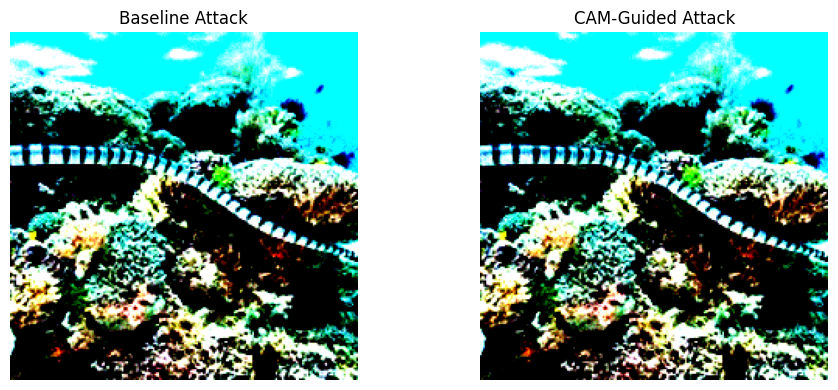

In [17]:
from matplotlib import pyplot as plt

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(results["baseline"]["x_adv"].squeeze().permute(1, 2, 0))
plt.title("Baseline Attack")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(results["with_CAM"]["x_adv"].squeeze().permute(1, 2, 0))
plt.title("CAM-Guided Attack")
plt.axis("off")

plt.tight_layout()
plt.show()


# Partial info updated

### Partial-Information Attack

The **Partial-Information Attack** operates in a scenario where the attacker only has access to the top-k predicted classes from the model, rather than the full probabilities. This attack consists of two main stages: **epsilon shrinking** and **NES-based gradient ascent**.

#### Arguments:
- `x_orig`: The original image tensor (1, C, H, W).
- `x_target`: An image that the model classifies as the target class `target_label`.
- `target_label`: The target class that the attacker wants to misclassify the image as.
- `epsilon_init`: The initial perturbation size (large value at the start).
- `epsilon_final`: The minimal perturbation allowed after shrinking.
- `decay_rate`: How quickly the perturbation (`epsilon`) shrinks during each step.
- `shrink_steps`: The number of steps to shrink the perturbation.
- `sigma`, `step_size`, `n_samples`: Parameters for NES gradient estimation (noise standard deviation, step size, and number of samples).
- `max_queries`: The maximum number of queries to the model allowed during the attack.
- `query_model_fn`: Function that returns the top-k predictions.
- `topk`: Number of top predictions that the attacker can access (partial information).
- `cam_mask`: An optional Grad-CAM mask to guide NES-based gradient estimation.

#### Approach:

1. **Stage 1: Epsilon Shrinking**:
   - The attack begins by gradually shrinking the perturbation (`epsilon`) from an initial large value (`epsilon_init`) towards a smaller value (`epsilon_final`). This helps bring the adversarial example (`x_adv`) closer to the original image (`x_orig`).
   - At each step, the model is queried to get the top-k predictions. If the target class is within the top-k, the perturbation is reduced, and the adversarial example is moved closer to the original image.
   - If the target class is no longer in the top-k predictions, the shrinking stops.

2. **Stage 2: NES-based Gradient Ascent**:
   - After epsilon shrinking, NES-based gradient ascent is used to refine the adversarial example.
   - The **proxy objective** is based on the rank of the target class within the top-k predictions. The adversarial example is updated iteratively by estimating gradients using NES and moving in the direction of the gradient.
   - The perturbation is clipped to ensure it stays within bounds, defined by `epsilon_final`.

3. **Termination**:
   - The attack terminates when the target class appears in the top-k predictions or the query budget is exhausted. If the target class is successfully placed in the top-k, the attack is successful.


In [18]:
def partial_info_attack(
    x_orig, x_target, target_label,
    epsilon_init=1.0, epsilon_final=0.05, decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005, step_size=0.01, n_samples=50, max_queries=2000,
    query_model_fn=query_model, topk=5, cam_mask=None
):
    """
    Partial-Information attack as per the paper.
    Works only with access to top-k predictions (not probabilities).

    Args:
        x_orig: original image tensor (1, C, H, W)
        x_target: image that model classifies as target_label
        target_label: target class index
        epsilon_init: initial perturbation (large)
        epsilon_final: minimal perturbation allowed
        decay_rate: how fast epsilon shrinks
        shrink_steps: how many steps for shrinking
        topk: number of labels attacker sees (partial-info setting)
        Other args as defined previously...

    Returns:
        x_adv: final adversarial example
        success: whether target_label is in top-k
        num_queries: total queries used
    """


    x_adv = x_target.clone().detach()
    epsilon = epsilon_init
    num_queries = 0

    # === Stage 1: Epsilon Shrinking ===
    for i in range(shrink_steps):
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()
        num_queries += 1

        if target_label in topk_preds:
            # shrink epsilon, move x_adv closer to x_orig
            direction = torch.sign(x_adv - x_orig)
            x_adv = x_adv - step_size * direction
            x_adv = clip(x_adv, x_orig, epsilon)
            epsilon = max(epsilon * decay_rate, epsilon_final)
        else:
            print(f"Target dropped out of top-{topk} during shrinking (step {i})")
            break

    # === Stage 2: NES-based gradient ascent ===
    def proxy_objective(x):
        preds = query_model_fn(x, return_probs=False).tolist()
        num_queries_ = 1
        if target_label in preds:
            # Better rank = higher reward (invert rank)
            rank_score = topk - preds.index(target_label)
            return rank_score
        else:
            return 0

    # NES loop after shrinking
    for _ in range(20):  # fixed PGD steps
        # grad = nes_gradient_estimate(x_adv, proxy_objective, sigma=sigma, n_samples=n_samples)
        if cam_mask is not None:
            grad = nes_gradient_estimate_weighted(x_adv, objective_fn, cam_mask, sigma, n_samples)
        else:
            grad = nes_gradient_estimate(x_adv, objective_fn, sigma, n_samples)
        num_queries += n_samples
        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon_final)

        # Check top-k
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()
        num_queries += 1
        if target_label in topk_preds:
            success = True
        else:
            success = False
            break

    return x_adv, success, num_queries


### Evaluate and Visualize Attack Results

#### `evaluate_attack`:
This function evaluates the performance of an attack (`attack_fn`) under two conditions: with and without using the Grad-CAM mask (`cam_mask`). For each condition, the function runs the attack, records success, number of queries, and the adversarial image.

- **Arguments**:
  - `attack_fn`: The attack function to be evaluated.
  - `x_orig`: The original image.
  - `x_target`: The target image classified as the target class.
  - `target_label`: The target class index.
  - `cam_mask`: The Grad-CAM mask used to guide the attack (optional).
  - `**kwargs`: Additional arguments for the attack function.
  
- **Returns**:
  - A dictionary containing the results for both conditions ("baseline" and "with_CAM"), including success status, number of queries, and adversarial images.

#### `visualize_results`:
This function visualizes the adversarial examples for both "baseline" and "with_CAM" conditions. It normalizes the images and displays them side by side with their success status and number of queries.

- **Arguments**:
  - `results`: The results dictionary from `evaluate_attack`.
  - `title`: The title to display for the plot.
  
- **Displays**:
  - A figure showing the adversarial images with titles that indicate the success and number of queries.


In [19]:
def evaluate_attack(attack_fn, x_orig, x_target, target_label, cam_mask, **kwargs):
    results = {}

    for use_cam in [False, True]:
        cam_input = cam_mask if use_cam else None

        x_adv, success, queries = attack_fn(
            x_orig=x_orig,
            x_target=x_target,
            target_label=target_label,
            cam_mask=cam_input,
            **kwargs
        )

        label = "with_CAM" if use_cam else "baseline"
        results[label] = {
            "success": success,
            "queries": queries,
            "x_adv": x_adv.detach().cpu()
        }

    return results

def visualize_results(results, title):
    import matplotlib.pyplot as plt

    plt.figure(figsize=(10, 4))
    for i, label in enumerate(["baseline", "with_CAM"]):
        img = results[label]["x_adv"].squeeze().permute(1, 2, 0).numpy()
        img = (img - img.min()) / (img.max() - img.min())  # normalize
        plt.subplot(1, 2, i+1)
        plt.imshow(img)
        plt.title(f"{label}\nSuccess: {results[label]['success']} | Queries: {results[label]['queries']}")
        plt.axis("off")

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()


# Update image path if you want to check for other images

In [20]:
image = Image.open('/content/watersnake.jpeg').convert('RGB')
x_target = transform(image).unsqueeze(0)  # (1, 3, 224, 224)
x_target = x_target.to(device)

# Not so great improvement still the same number of queries

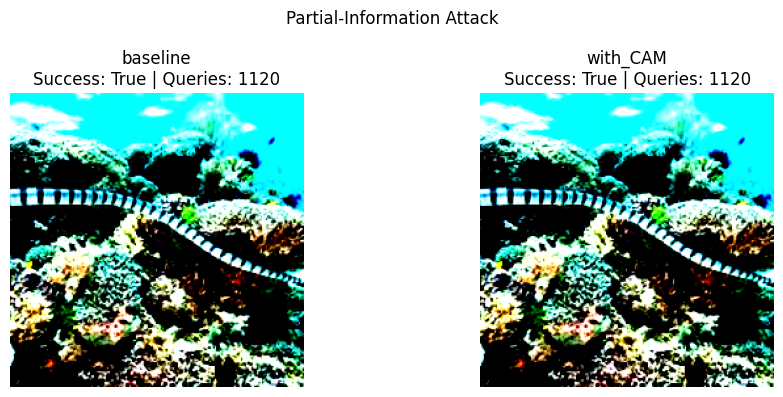

In [21]:
results_pi = evaluate_attack(
    partial_info_attack,
    x_orig=x_orig,
    x_target=x_target,
    target_label=target_label,
    cam_mask=cam_mask,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=2000,
    query_model_fn=query_model,
    topk=5
)

visualize_results(results_pi, "Partial-Information Attack")


# Label only updated

### Label-Only Black-Box Adversarial Attack

The **Label-Only Black-Box Adversarial Attack** assumes the attacker has access only to the top-k class labels predicted by the model, rather than the full probabilities. The attack consists of two phases: **epsilon shrinking** and **proxy optimization** based on rank.

#### Arguments:
- `x_orig`: The original image tensor (1, C, H, W).
- `x_target`: An image that the model classifies as the target class `target_label`.
- `target_label`: The target class index that the attacker wants to misclassify the image as.
- `epsilon_init`: The initial perturbation size (large value).
- `epsilon_final`: The minimum perturbation size allowed after shrinking.
- `decay_rate`: The rate at which `epsilon` shrinks during each step.
- `shrink_steps`: The number of steps to shrink the perturbation.
- `sigma`, `step_size`, `n_samples`: Parameters for NES gradient estimation (noise standard deviation, step size, and number of samples).
- `max_queries`: The maximum number of queries allowed to the model.
- `query_model_fn`: Function that returns the top-k predicted class labels.
- `topk`: Number of top predicted labels visible to the attacker.
- `cam_mask`: An optional Grad-CAM mask to guide the NES-based gradient estimation.

#### Phases of the Attack:

1. **Phase 1: Shrinking Epsilon (Epsilon Shrinking)**:
   - The attack starts by reducing the perturbation (`epsilon`) from a large value (`epsilon_init`) to a smaller value (`epsilon_final`), in a controlled manner.
   - At each step, the model is queried to get the top-k predicted labels. If the target class is among the top-k, the adversarial example (`x_adv`) is moved closer to the original image (`x_orig`) by adjusting the perturbation.
   - The perturbation (`epsilon`) is reduced at each step, ensuring that the adversarial example stays within reasonable bounds while still attempting to target the model.

2. **Phase 2: Proxy Optimization Based on Rank**:
   - After epsilon shrinking, the attack moves to **proxy optimization**, where the goal is to increase the rank of the target label in the top-k predictions.
   - The **proxy objective** is based on the rank of the target label within the top-k predictions. If the target label is present, a higher rank score (lower rank index) leads to a better objective value.
   - NES-based gradient ascent is used to refine the adversarial example by estimating the gradients and updating the image iteratively.
   - The perturbation is clipped to ensure it remains within the bounds defined by `epsilon_final`.

3. **Termination**:
   - The attack terminates when the target class is successfully placed in the top-k predicted labels or when the query budget is exhausted. If the target class appears in the top-k, the attack is considered successful.


In [22]:
def label_only_attack(
    x_orig, x_target, target_label,
    epsilon_init=1.0, epsilon_final=0.05, decay_rate=0.98, shrink_steps=100,
    sigma=0.005, step_size=0.01, n_samples=50, max_queries=2000,
    query_model_fn=query_model, topk=5, cam_mask=None
):
    """
    Label-only black-box adversarial attack.
    Assumes only top-k class labels are visible.
    """

    x_adv = x_target.clone().detach()
    epsilon = epsilon_init
    num_queries = 0

    # === Phase 1: Shrinking epsilon (just like PI)
    for i in range(shrink_steps):
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()
        num_queries += 1

        if target_label in topk_preds:
            direction = torch.sign(x_adv - x_orig)
            x_adv = x_adv - step_size * direction
            x_adv = clip(x_adv, x_orig, epsilon)
            epsilon = max(epsilon * decay_rate, epsilon_final)
        else:
            print(f"Target dropped from top-{topk} during shrinking.")
            break

    # === Phase 2: Proxy optimization (based on rank)
    def proxy_objective(x):
        preds = query_model_fn(x, return_probs=False).tolist()
        if target_label in preds:
            rank_score = topk - preds.index(target_label)
        else:
            rank_score = 0
        return rank_score  # higher is better

    for _ in range(20):  # fixed PGD steps
        # grad = nes_gradient_estimate(x_adv, proxy_objective, sigma=sigma, n_samples=n_samples)
        if cam_mask is not None:
            grad = nes_gradient_estimate_weighted(x_adv, objective_fn, cam_mask, sigma, n_samples)
        else:
            grad = nes_gradient_estimate(x_adv, objective_fn, sigma, n_samples)
        num_queries += n_samples

        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon_final)

        preds = query_model_fn(x_adv, return_probs=False).tolist()
        num_queries += 1
        if target_label in preds:
            success = True
        else:
            success = False
            break

    return x_adv, success, num_queries


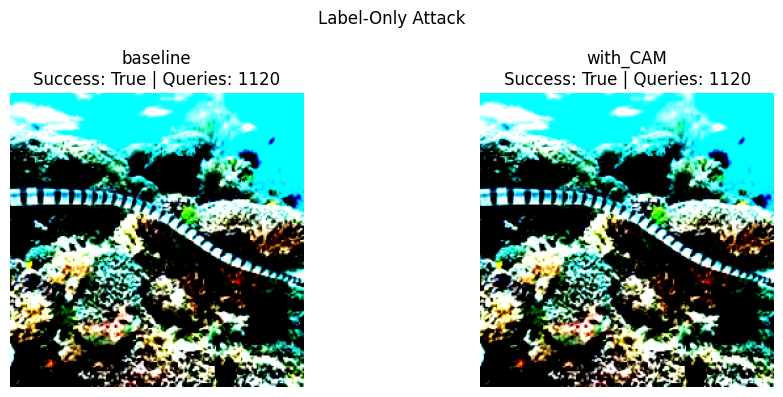

In [23]:
results_lo = evaluate_attack(
    label_only_attack,
    x_orig=x_orig,
    x_target=x_target,
    target_label=target_label,
    cam_mask=cam_mask,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=2000,
    query_model_fn=query_model,
    topk=5
)

visualize_results(results_lo, "Label-Only Attack")


### Patch-wise NES Gradient Estimation with CAM Weighting

The **patch-wise NES gradient estimation** introduces the concept of applying perturbations to smaller patches of the image, rather than the whole image at once. This method allows for more fine-grained control over the perturbation process, which can be helpful when using guidance like a CAM mask.

#### Key Upgrades:
- **Patch-wise Perturbations**: Instead of applying noise to the entire image, noise is applied to patches of the image (defined by `patch_size`), making the perturbation more localized.
- **CAM Mask Weighting**: After calculating the gradient estimate for each patch, the result is scaled by the CAM mask, focusing the attack on regions of the image that are more relevant according to the model’s attention (highlighted by the CAM).
- **Noise Upsampling**: The noise generated for each patch is upsampled to match the original image size by repeating it, ensuring that each pixel in the image receives a perturbation based on its corresponding patch.

This approach helps target specific areas in the image, potentially making the attack more efficient and targeted, especially when combined with a CAM mask that highlights important regions.


In [24]:
def nes_gradient_estimate_patchwise_weighted(x, objective_fn, cam_mask,
                                             patch_size=32, sigma=0.001, n_samples=50):
    """
    NES gradient estimation where perturbations are applied patch-wise.

    Args:
        x (Tensor): input image (1, 3, H, W)
        objective_fn (callable): returns scalar objective
        cam_mask (Tensor): (1, 1, H, W) normalized CAM heatmap
        patch_size (int): size of square patch (e.g., 32)
        sigma (float): noise std
        n_samples (int): number of NES samples

    Returns:
        grad_estimate (Tensor): (1, 3, H, W) NES gradient
    """
    B, C, H, W = x.shape
    assert H % patch_size == 0 and W % patch_size == 0, "Image size must be divisible by patch size"
    num_patches_h = H // patch_size
    num_patches_w = W // patch_size

    grads = torch.zeros_like(x)

    for _ in range(n_samples // 2):
        # Random noise per patch
        patch_noise = torch.randn(1, C, num_patches_h, num_patches_w, device=x.device)

        # Upsample noise to full image size by repeating
        noise = patch_noise.repeat_interleave(patch_size, dim=2).repeat_interleave(patch_size, dim=3)

        f_pos = objective_fn((x + sigma * noise).clamp(0, 1))
        f_neg = objective_fn((x - sigma * noise).clamp(0, 1))

        grads += (f_pos - f_neg) * noise

    grad_estimate = grads / (sigma * n_samples)

    # Resize and apply CAM mask
    cam_mask_resized = F.interpolate(cam_mask, size=(H, W), mode='bilinear', align_corners=False)
    if cam_mask_resized.shape[1] == 1:
        cam_mask_resized = cam_mask_resized.repeat(1, 3, 1, 1)

    return grad_estimate * cam_mask_resized


# Updating the functions taking the parameter patch as well

In [25]:
def query_limited_attack_patchwise(
    x_orig, target_label, epsilon, sigma, step_size, n_samples, max_queries,
    query_model_fn, cam_mask=None, patch_size=32
):
    x_adv = x_orig.clone().detach()
    num_queries = 0
    success = False

    def objective_fn(x):
        probs = query_model_fn(x, return_probs=True)
        return probs[target_label].item()

    while num_queries < max_queries:
        if cam_mask is not None:
            grad = nes_gradient_estimate_patchwise_weighted(x_adv, objective_fn, cam_mask, patch_size, sigma, n_samples)
        else:
            grad = nes_gradient_estimate_patchwise_weighted(x_adv, objective_fn, torch.ones_like(x_orig[:, :1]), patch_size, sigma, n_samples)

        num_queries += n_samples

        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon)

        probs = query_model_fn(x_adv, return_probs=True)
        num_queries += 1
        top5 = torch.topk(probs, k=5).indices.tolist()
        if target_label in top5:
            success = True
            break

    return x_adv, success, num_queries

In [26]:
objective_fn(x_orig)

0.9641851186752319

In [27]:
x_adv, success, queries = query_limited_attack_patchwise(
    x_orig=x_orig,
    target_label=target_label,
    epsilon=0.05,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=1000,
    query_model_fn=query_model,
    cam_mask=cam_mask,       # optional Grad-CAM mask
    patch_size=32            # patch size (divides image dimensions)
)


### Visualizing Patch-wise Perturbation

This function visualizes the average perturbation applied to each patch of the image, highlighting regions with the most significant changes between the original and adversarial images.


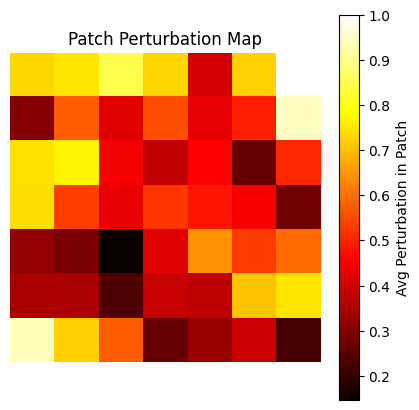

In [28]:
import matplotlib.pyplot as plt
import numpy as np

def visualize_patchwise_perturbation(x_orig, x_adv, patch_size=32, title="Patch Perturbation Map"):
    diff = (x_adv - x_orig).abs().sum(dim=1, keepdim=True)  # (1, 1, H, W)
    diff = diff.squeeze().cpu().numpy()

    # Sum per patch
    H, W = diff.shape
    patch_map = np.zeros((H // patch_size, W // patch_size))
    for i in range(0, H, patch_size):
        for j in range(0, W, patch_size):
            patch_value = diff[i:i+patch_size, j:j+patch_size].mean()
            patch_map[i // patch_size, j // patch_size] = patch_value

    # Normalize and visualize
    patch_map = patch_map / patch_map.max()

    plt.figure(figsize=(5, 5))
    plt.imshow(patch_map, cmap="hot", interpolation="nearest")
    plt.title(title)
    plt.colorbar(label="Avg Perturbation in Patch")
    plt.axis("off")
    plt.show()

visualize_patchwise_perturbation(x_orig, x_adv, patch_size=32)

### Visualizing Patch-wise Perturbation with CAM-Guided Attack

This function displays the original and adversarial images, their pixel-wise differences, and a heatmap of perturbation applied to each patch, highlighting regions of significant change in a CAM-guided patch attack.


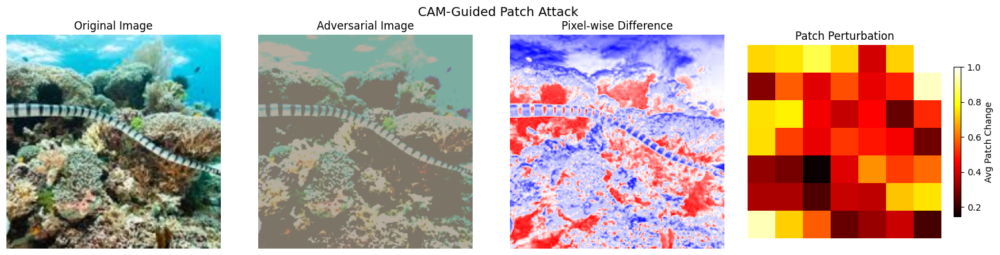

In [29]:
import matplotlib.pyplot as plt
import numpy as np
import torch

def unnormalize(img_tensor):
    """Unnormalize tensor image (assumes ImageNet stats)"""
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1).to(img_tensor.device)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1).to(img_tensor.device)
    return (img_tensor * std + mean).clamp(0, 1)

def visualize_patchwise_perturbation(x_orig, x_adv, patch_size=32, title="Patch Perturbation Map"):
    x_orig = x_orig.squeeze()
    x_adv = x_adv.squeeze()

    # Unnormalize for display
    x_orig_disp = unnormalize(x_orig).permute(1, 2, 0).cpu().numpy()
    x_adv_disp = unnormalize(x_adv).permute(1, 2, 0).cpu().numpy()

    # Compute absolute difference heatmap
    diff_map = (x_adv - x_orig).abs().sum(dim=0).cpu().numpy()

    # Patch-level difference
    # H, W = diff_map.shape[1], diff_map.shape[2] if diff_map.ndim == 3 else diff_map.shape
    H, W = diff_map.shape
    patch_map = np.zeros((H // patch_size, W // patch_size))
    for i in range(0, H, patch_size):
        for j in range(0, W, patch_size):
            patch_value = diff_map[i:i+patch_size, j:j+patch_size].mean()
            patch_map[i // patch_size, j // patch_size] = patch_value

    patch_map = patch_map / patch_map.max()

    # Plot all views
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))

    axs[0].imshow(x_orig_disp)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(x_adv_disp)
    axs[1].set_title("Adversarial Image")
    axs[1].axis("off")

    axs[2].imshow((x_adv_disp - x_orig_disp).mean(axis=2), cmap='bwr')
    axs[2].set_title("Pixel-wise Difference")
    axs[2].axis("off")

    im = axs[3].imshow(patch_map, cmap="hot", interpolation="nearest")
    axs[3].set_title("Patch Perturbation")
    axs[3].axis("off")
    fig.colorbar(im, ax=axs[3], shrink=0.7, label="Avg Patch Change")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()



visualize_patchwise_perturbation(x_orig, x_adv, patch_size=32, title="CAM-Guided Patch Attack")


### Comparing Query Efficiency of Different Attacks

This function compares the query efficiency of three different attack methods: Pixel-wise NES, Patch-wise NES, and CAM-guided Patch-wise NES. It runs each attack and returns the results, including the success status, number of queries used, and the generated adversarial example. The CAM mask is used only in the CAM-guided attack variant.


In [30]:
def compare_query_efficiency(x_orig, target_label, cam_mask):
    methods = {
        "Pixel-wise NES": {
            "fn": query_limited_attack,
            "extra_args": {}
        },
        "Patch-wise NES": {
            "fn": query_limited_attack_patchwise,
            "extra_args": {"patch_size": 32}
        },
        "CAM + Patch-wise NES": {
            "fn": query_limited_attack_patchwise,
            "extra_args": {"patch_size": 32, "cam_mask": cam_mask}
        }
    }

    results = {}
    for name, method in methods.items():
        print(f"\n Running: {name}")
        attack_fn = method["fn"]
        extra_args = method["extra_args"]

        x_adv, success, queries = attack_fn(
            x_orig=x_orig,
            target_label=target_label,
            epsilon=0.05,
            sigma=0.005,
            step_size=0.01,
            n_samples=50,
            max_queries=1000,
            query_model_fn=query_model,
            **extra_args  # only passed to methods that expect them
        )

        results[name] = {
            "success": success,
            "queries": queries,
            "x_adv": x_adv.detach().cpu()
        }

    return results


### Plotting Query Comparison

This function visualizes the comparison of query efficiency across different attack methods (Pixel-wise NES, Patch-wise NES, and CAM-guided Patch-wise NES) by plotting a bar chart. The number of queries used for each method is displayed on top of each bar for easy comparison.


In [31]:
def plot_query_comparison(results):
    names = list(results.keys())
    queries = [results[name]["queries"] for name in names]
    colors = ["gray", "skyblue", "orangered"]

    plt.figure(figsize=(8, 5))
    bars = plt.bar(names, queries, color=colors)
    for bar, q in zip(bars, queries):
        plt.text(bar.get_x() + bar.get_width() / 2, q + 5, str(q), ha='center', va='bottom')
    plt.title("Query Efficiency: Pixel vs Patch vs CAM+Patch")
    plt.ylabel("Number of Queries")
    plt.ylim(0, max(queries) + 50)
    plt.xticks(rotation=15)
    plt.show()



 Running: Pixel-wise NES

 Running: Patch-wise NES

 Running: CAM + Patch-wise NES


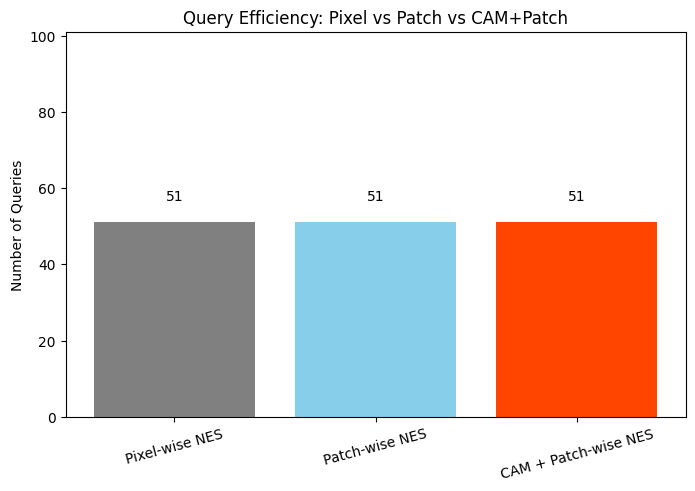

In [32]:
results = compare_query_efficiency(x_orig, target_label, cam_mask)
plot_query_comparison(results)


### Partial Information Patchwise Attack

This function implements a partial information attack, where the attacker only has access to the top-k predicted labels of the model. In this case, perturbations are applied at the patch level. The method involves two main phases:

1. **Epsilon Shrinking**: The adversarial example is adjusted in such a way that it remains within a shrinking perturbation limit. If the target class is still among the top-k predictions, epsilon is reduced (decayed) over a set number of iterations.
  
2. **Patchwise NES Gradient Estimation**: NES-based gradient estimation is applied at the patch level (instead of pixel-wise) with or without the CAM mask, depending on whether it is provided. The adversarial image is iteratively updated until the target class is no longer among the top-k predictions.

The method tracks the number of queries used and checks for success at each step, returning the final adversarial image along with a success flag and the total queries used.


In [33]:
def partial_info_attack_patchwise(
    x_orig, x_target, target_label, epsilon_init=1.0, epsilon_final=0.05, decay_rate=0.98,
    shrink_steps=100, sigma=0.005, step_size=0.01, n_samples=50, max_queries=2000,
    query_model_fn=None, topk=5, cam_mask=None, patch_size=32
):
    x_adv = x_target.clone().detach()
    epsilon = epsilon_init
    num_queries = 0

    for i in range(shrink_steps):
        # Make the output of query_model iterable by converting it to a list
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()

        # In case topk_preds is a single integer wrap it in a list for checking
        topk_preds = [topk_preds] if isinstance(topk_preds, int) else topk_preds

        num_queries += 1

        if target_label in topk_preds:
            direction = torch.sign(x_adv - x_orig)
            x_adv = x_adv - step_size * direction
            x_adv = clip(x_adv, x_orig, epsilon)
            epsilon = max(epsilon * decay_rate, epsilon_final)
        else:
            break

    def proxy_objective(x):
        # make sure the query_model output is a list, then get the first element (which is also a list of predictions)
        preds = query_model_fn(x, return_probs=False).tolist()
        preds = preds[0] if isinstance(preds[0], list) else preds

        return topk - preds.index(target_label) if target_label in preds else 0

    for _ in range(20):
        if cam_mask is not None:
            grad = nes_gradient_estimate_patchwise_weighted(x_adv, proxy_objective, cam_mask, patch_size, sigma, n_samples)
        else:
            grad = nes_gradient_estimate_patchwise_weighted(x_adv, proxy_objective, torch.ones_like(x_orig[:, :1]), patch_size, sigma, n_samples)

        num_queries += n_samples
        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon_final)

        # make sure the query_model output is a list, then get the first element (which is also a list of predictions)
        preds = query_model_fn(x_adv, return_probs=False).tolist()
        preds = preds[0] if isinstance(preds[0], list) else preds

        num_queries += 1
        if target_label not in preds:
            return x_adv, False, num_queries

    return x_adv, True, num_queries

In [34]:
def visualize_patchwise_nocam_perturbation(x_orig, x_adv, patch_size=32, title="Patchwise NES Perturbation Map"):
    x_orig = x_orig.squeeze()
    x_adv = x_adv.squeeze()

    x_orig_disp = unnormalize(x_orig).permute(1, 2, 0).cpu().numpy()
    x_adv_disp = unnormalize(x_adv).permute(1, 2, 0).cpu().numpy()

    diff_map = (x_adv - x_orig).abs().sum(dim=0).cpu().numpy()

    H, W = diff_map.shape
    patch_map = np.zeros((H // patch_size, W // patch_size))
    for i in range(0, H, patch_size):
        for j in range(0, W, patch_size):
            patch_value = diff_map[i:i+patch_size, j:j+patch_size].mean()
            patch_map[i // patch_size, j // patch_size] = patch_value

    patch_map = patch_map / patch_map.max()

    fig, axs = plt.subplots(1, 4, figsize=(16, 4))

    axs[0].imshow(x_orig_disp)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(x_adv_disp)
    axs[1].set_title("Adversarial Image")
    axs[1].axis("off")

    axs[2].imshow((x_adv_disp - x_orig_disp).mean(axis=2), cmap='bwr')
    axs[2].set_title("Pixel-wise Difference")
    axs[2].axis("off")

    im = axs[3].imshow(patch_map, cmap="YlGn", interpolation="nearest")
    axs[3].set_title("Patch Perturbation")
    axs[3].axis("off")
    fig.colorbar(im, ax=axs[3], shrink=0.7, label="Avg Patch Change")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


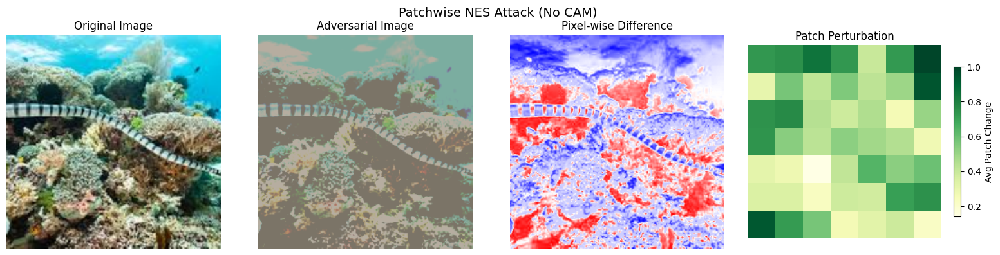

In [35]:
# Run the partial info patchwise attack (without CAM guidance)
x_adv_result, success, queries = partial_info_attack_patchwise(
    x_orig=x_orig,
    x_target=x_orig,  # start from original image
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=2000,
    query_model_fn=query_model,  # assuming this is already defined and working
    topk=5,
    cam_mask=None,  # no CAM guidance
    patch_size=32
)

# Visualize the patch-wise perturbations
visualize_patchwise_nocam_perturbation(x_orig, x_adv_result, patch_size=32, title="Patchwise NES Attack (No CAM)")


In [36]:
def compare_partial_info_attack(x_orig, x_target, target_label, cam_mask):
    methods = {
        "Patch-wise PI": {
            "fn": partial_info_attack_patchwise,
            "extra_args": {"patch_size": 32}
        },
        "CAM + Patch-wise PI": {
            "fn": partial_info_attack_patchwise,
            "extra_args": {"patch_size": 32, "cam_mask": cam_mask}
        }
    }

    results = {}
    for name, method in methods.items():
        print(f"\n  Running: {name}")
        attack_fn = method["fn"]
        extra_args = method["extra_args"]

        x_adv, success, queries = attack_fn(
            x_orig=x_orig,
            x_target=x_target,
            target_label=target_label,
            epsilon_init=1.0,
            epsilon_final=0.05,
            decay_rate=0.98,
            shrink_steps=100,
            sigma=0.005,
            step_size=0.01,
            n_samples=50,
            max_queries=2000,
            query_model_fn=query_model,
            topk=5,
            **extra_args
        )

        results[name] = {
            "success": success,
            "queries": queries,
            "x_adv": x_adv.detach().cpu()
        }

    return results


# Same number of queries


  Running: Patch-wise PI

  Running: CAM + Patch-wise PI


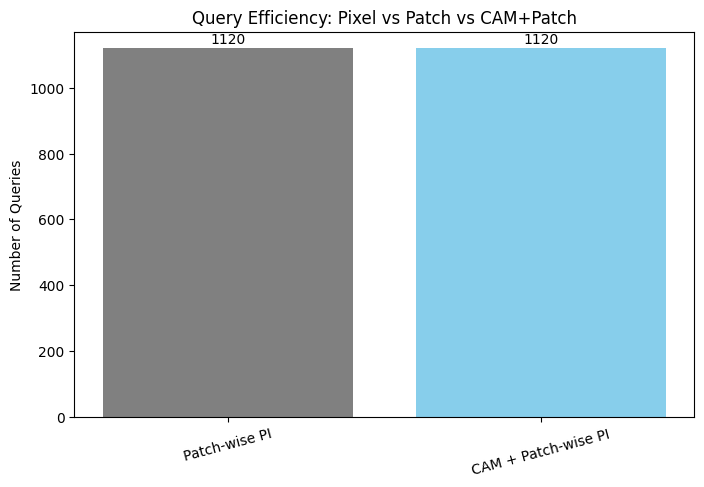

In [37]:
results_pi = compare_partial_info_attack(x_orig, x_target, target_label, cam_mask)
plot_query_comparison(results_pi)


In [38]:
def visualize_patchwise_labelonly_perturbation(x_orig, x_adv, patch_size=32, title="Label-Only Patch Perturbation Map"):
    x_orig = x_orig.squeeze()
    x_adv = x_adv.squeeze()

    x_orig_disp = unnormalize(x_orig).permute(1, 2, 0).cpu().numpy()
    x_adv_disp = unnormalize(x_adv).permute(1, 2, 0).cpu().numpy()

    diff_map = (x_adv - x_orig).abs().sum(dim=0).cpu().numpy()

    H, W = diff_map.shape
    patch_map = np.zeros((H // patch_size, W // patch_size))
    for i in range(0, H, patch_size):
        for j in range(0, W, patch_size):
            patch_value = diff_map[i:i+patch_size, j:j+patch_size].mean()
            patch_map[i // patch_size, j // patch_size] = patch_value

    patch_map = patch_map / patch_map.max()

    fig, axs = plt.subplots(1, 4, figsize=(16, 4))

    axs[0].imshow(x_orig_disp)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(x_adv_disp)
    axs[1].set_title("Adversarial Image")
    axs[1].axis("off")

    axs[2].imshow((x_adv_disp - x_orig_disp).mean(axis=2), cmap='bwr')
    axs[2].set_title("Pixel-wise Difference")
    axs[2].axis("off")

    im = axs[3].imshow(patch_map, cmap="viridis", interpolation="nearest")
    axs[3].set_title("Patch Perturbation")
    axs[3].axis("off")
    fig.colorbar(im, ax=axs[3], shrink=0.7, label="Avg Patch Change")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


In [39]:
def label_only_attack_patchwise(
    x_orig, x_target, target_label, epsilon_init=1.0, epsilon_final=0.05, decay_rate=0.98,
    shrink_steps=100, sigma=0.005, step_size=0.01, n_samples=50, max_queries=2000,
    query_model_fn=None, topk=5, cam_mask=None, patch_size=32
):
    x_adv = x_target.clone().detach()
    epsilon = epsilon_init
    num_queries = 0

    for i in range(shrink_steps):
        # Ensure topk_preds is a list
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()
        # If topk_preds is an int, make it a list
        if isinstance(topk_preds, int):
            topk_preds = [topk_preds]
        num_queries += 1

        if target_label in topk_preds:
            direction = torch.sign(x_adv - x_orig)
            x_adv = x_adv - step_size * direction
            x_adv = clip(x_adv, x_orig, epsilon)
            epsilon = max(epsilon * decay_rate, epsilon_final)
        else:
            break

    def proxy_objective(x):
        # Ensure preds is a list
        preds = query_model_fn(x, return_probs=False).tolist()
        # If preds is an int, make it a list
        if isinstance(preds, int):
            preds = [preds]
        return topk - preds.index(target_label) if target_label in preds else 0

    for _ in range(20):
        if cam_mask is not None:
            grad = nes_gradient_estimate_patchwise_weighted(x_adv, proxy_objective, cam_mask, patch_size, sigma, n_samples)
        else:
            grad = nes_gradient_estimate_patchwise_weighted(x_adv, proxy_objective, torch.ones_like(x_orig[:, :1]), patch_size, sigma, n_samples)

        num_queries += n_samples
        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon_final)

        # Ensure preds is a list
        preds = query_model_fn(x_adv, return_probs=False).tolist()
        # If preds is an int, make it a list
        if isinstance(preds, int):
            preds = [preds]
        num_queries += 1
        if target_label not in preds:
            return x_adv, False, num_queries

    return x_adv, True, num_queries

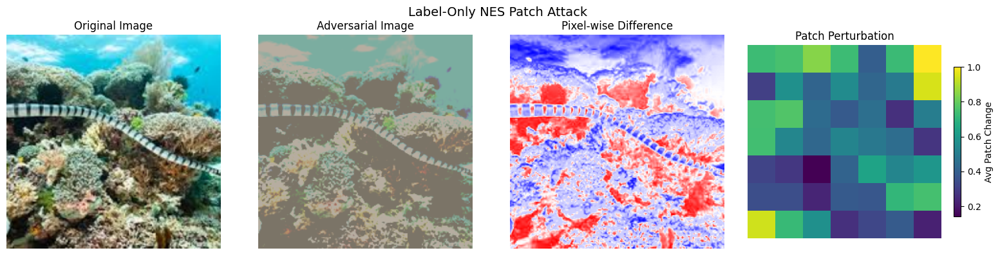

In [40]:
# Run the label-only patchwise attack
x_adv_labelonly, success_labelonly, queries_labelonly = label_only_attack_patchwise(
    x_orig=x_orig,
    x_target=x_orig,  # starting from the original image
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=2000,
    query_model_fn=query_model,  # assuming this is your prediction function
    topk=5,
    cam_mask=None,  # label-only assumes no CAM
    patch_size=32
)

# Visualize the resulting perturbations
visualize_patchwise_labelonly_perturbation(
    x_orig,
    x_adv_labelonly,
    patch_size=32,
    title="Label-Only NES Patch Attack"
)


In [41]:
def compare_label_only_attack(x_orig, x_target, target_label, cam_mask):
    methods = {
        "Patch-wise LO": {
            "fn": label_only_attack_patchwise,
            "extra_args": {"patch_size": 32}
        },
        "CAM + Patch-wise LO": {
            "fn": label_only_attack_patchwise,
            "extra_args": {"patch_size": 32, "cam_mask": cam_mask}
        }
    }

    results = {}
    for name, method in methods.items():
        print(f"\n Running: {name}")
        attack_fn = method["fn"]
        extra_args = method["extra_args"]

        x_adv, success, queries = attack_fn(
            x_orig=x_orig,
            x_target=x_target,
            target_label=target_label,
            epsilon_init=1.0,
            epsilon_final=0.05,
            decay_rate=0.98,
            shrink_steps=100,
            sigma=0.005,
            step_size=0.01,
            n_samples=50,
            max_queries=2000,
            query_model_fn=query_model,
            topk=5,
            **extra_args
        )

        results[name] = {
            "success": success,
            "queries": queries,
            "x_adv": x_adv.detach().cpu()
        }

    return results



 Running: Patch-wise LO

 Running: CAM + Patch-wise LO


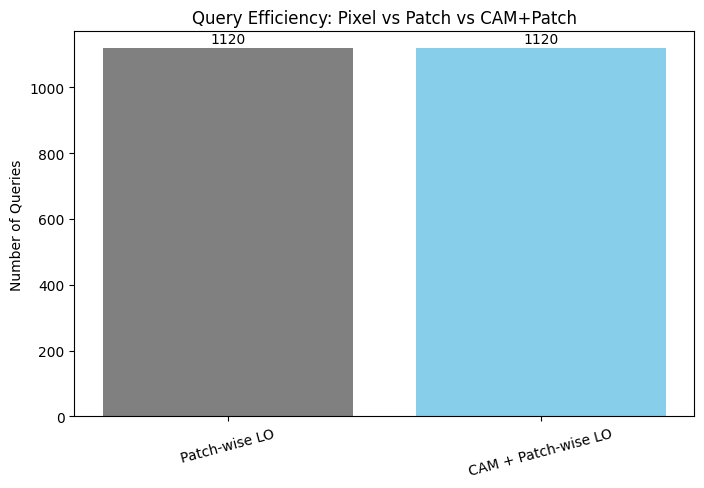

In [42]:
results_lo = compare_label_only_attack(x_orig, x_target, target_label, cam_mask)
plot_query_comparison(results_lo)


### Temperature Schedule for Epsilon Decay

The `temperature_schedule` function adjusts the epsilon value (perturbation magnitude) based on a given schedule. The schedule determines how epsilon decays throughout the attack process.

1. **Parameters**:
    - `current_step`: The current iteration step.
    - `total_steps`: The total number of steps for the attack.
    - `epsilon_init`: The initial epsilon value.
    - `epsilon_final`: The final (minimal) epsilon value after decay.
    - `strategy`: The strategy for epsilon decay, which can either be `"cosine"` or `"linear"`.

2. **Strategies**:
    - **Cosine Decay** (`"cosine"`): The epsilon decays according to a cosine function, starting at `epsilon_init` and smoothly reducing to `epsilon_final` over the total steps.
    - **Linear Decay** (`"linear"`): The epsilon linearly decays from `epsilon_init` to `epsilon_final`.

3. **Return**: The function returns the scaled epsilon for the current step, which can be used to update the perturbation during each iteration of the attack.

This function allows for more flexible control over the perturbation budget throughout the attack process.


In [43]:
def temperature_schedule(current_step, total_steps, epsilon_init, epsilon_final, strategy="cosine"):
    """Return temperature-scaled epsilon for current step"""
    if strategy == "cosine":
        factor = 0.5 * (1 + np.cos(np.pi * current_step / total_steps))
    elif strategy == "linear":
        factor = 1 - (current_step / total_steps)
    else:
        raise ValueError("Unsupported strategy")
    return epsilon_final + (epsilon_init - epsilon_final) * factor


### Upgrade in `query_limited_attack_patchwise_temp`:

1. **Temperature Scheduling for Epsilon**:
   - Introduces a dynamic `epsilon` adjustment using a **temperature schedule** (cosine or linear decay), allowing for more controlled and adaptive perturbation magnitudes.

2. **Dynamic Epsilon**:
   - Epsilon decays over time, starting with larger perturbations and reducing them as the attack progresses.

3. **Early Stopping**:
   - The attack stops early if the target label is successfully removed from predictions, improving efficiency.

This approach enhances the attack's adaptability and efficiency compared to previous static epsilon methods.


In [44]:
def query_limited_attack_patchwise_temp(
    x_orig, target_label, epsilon_init=1.0, epsilon_final=0.05,
    sigma=0.005, step_size=0.01, n_samples=50, max_queries=2000,
    query_model_fn=None, cam_mask=None, patch_size=32
):
    x_adv = x_orig.clone().detach()
    num_queries = 0

    def proxy_objective(x):
        preds = query_model_fn(x, return_probs=False).tolist()
        preds = preds[0] if isinstance(preds[0], list) else preds
        return -int(target_label in preds)

    total_steps = max_queries // (n_samples + 1)

    for step in range(total_steps):
        epsilon = temperature_schedule(step, total_steps, epsilon_init, epsilon_final)

        grad = nes_gradient_estimate_patchwise_weighted(
            x_adv, proxy_objective,
            cam_mask if cam_mask is not None else torch.ones_like(x_orig[:, :1]),
            patch_size, sigma, n_samples
        )

        num_queries += n_samples

        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon)

        preds = query_model_fn(x_adv, return_probs=False).tolist()
        preds = preds[0] if isinstance(preds[0], list) else preds
        num_queries += 1
        if target_label not in preds:
            return x_adv, False, num_queries

        if num_queries >= max_queries:
            break

    return x_adv, True, num_queries


In [45]:
def visualize_patchwise_querylimited_temp(x_orig, x_adv, patch_size=32, title="Query-Limited NES Attack (Temp Scheduling)"):
    x_orig = x_orig.squeeze()
    x_adv = x_adv.squeeze()

    # Unnormalize for display
    x_orig_disp = unnormalize(x_orig).permute(1, 2, 0).cpu().numpy()
    x_adv_disp = unnormalize(x_adv).permute(1, 2, 0).cpu().numpy()

    # Compute absolute difference heatmap
    diff_map = (x_adv - x_orig).abs().sum(dim=0).cpu().numpy()

    H, W = diff_map.shape
    patch_map = np.zeros((H // patch_size, W // patch_size))
    for i in range(0, H, patch_size):
        for j in range(0, W, patch_size):
            patch_value = diff_map[i:i+patch_size, j:j+patch_size].mean()
            patch_map[i // patch_size, j // patch_size] = patch_value

    patch_map = patch_map / patch_map.max()

    # Plot all views
    fig, axs = plt.subplots(1, 4, figsize=(16, 4))

    axs[0].imshow(x_orig_disp)
    axs[0].set_title("Original Image")
    axs[0].axis("off")

    axs[1].imshow(x_adv_disp)
    axs[1].set_title("Adversarial Image")
    axs[1].axis("off")

    axs[2].imshow((x_adv_disp - x_orig_disp).mean(axis=2), cmap='bwr')
    axs[2].set_title("Pixel-wise Difference")
    axs[2].axis("off")

    im = axs[3].imshow(patch_map, cmap="hot", interpolation="nearest")
    axs[3].set_title("Patch Perturbation")
    axs[3].axis("off")
    fig.colorbar(im, ax=axs[3], shrink=0.7, label="Avg Patch Change")

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()


Attack Success: Yes
Queries Used: 1989


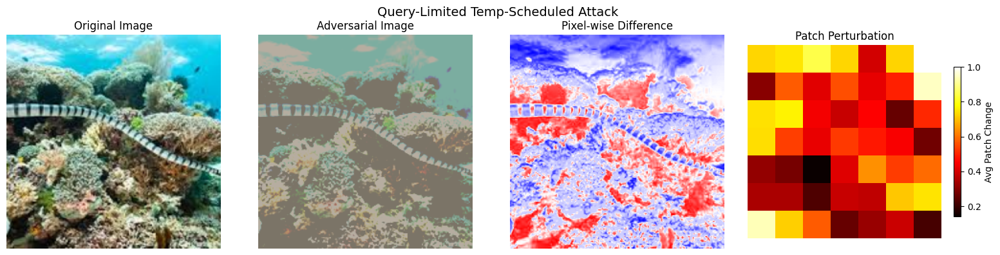

In [46]:
# Example usage
x_adv_temp, success_temp, queries_temp = query_limited_attack_patchwise_temp(
    x_orig=x_orig,                      # original image tensor (1, C, H, W)
    target_label=target_label,         # the target label for the attack
    epsilon_init=1.0,
    epsilon_final=0.05,
    sigma=0.005,
    step_size=0.01,
    n_samples=50,
    max_queries=2000,
    query_model_fn=query_model,     # your queryable model interface
    cam_mask=None,                     # or pass a valid mask if needed
    patch_size=32
)

print("Attack Success:", "Yes" if success_temp else "No")
print("Queries Used:", queries_temp)

# Visualize result
visualize_patchwise_querylimited_temp(
    x_orig, x_adv_temp, patch_size=32,
    title="Query-Limited Temp-Scheduled Attack"
)


In [47]:
def plot_query_comparison(query_std, query_temp, success_std=True, success_temp=True):
    methods = ['Standard NES', 'Temp-Scheduled NES']
    queries = [query_std, query_temp]
    colors = ['skyblue', 'salmon']

    plt.figure(figsize=(6, 4))
    bars = plt.bar(methods, queries, color=colors)

    # Add success or failure annotation
    for i, bar in enumerate(bars):
        yval = bar.get_height()
        label = "✓" if (success_std if i == 0 else success_temp) else "✗"
        plt.text(bar.get_x() + bar.get_width()/2, yval + 10, f"{int(yval)} Q\n{label}",
                 ha='center', va='bottom', fontsize=10, fontweight='bold')

    plt.ylabel("Number of Queries")
    plt.title("Query Count Comparison")
    plt.ylim(0, max(queries) * 1.2)
    plt.tight_layout()
    plt.show()


# Number of queries reduced now

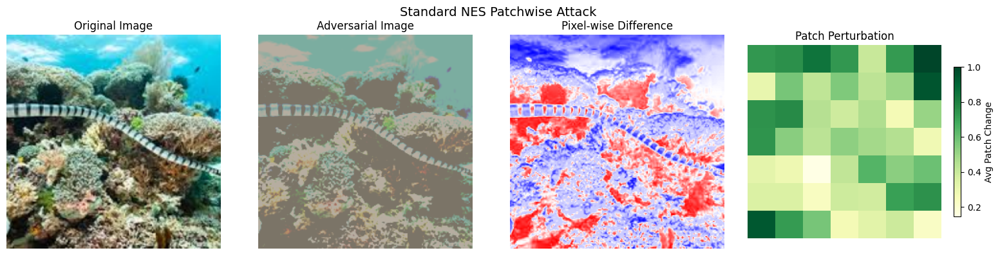

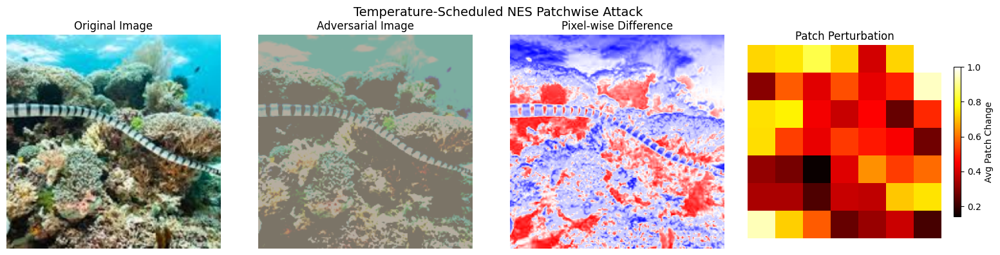

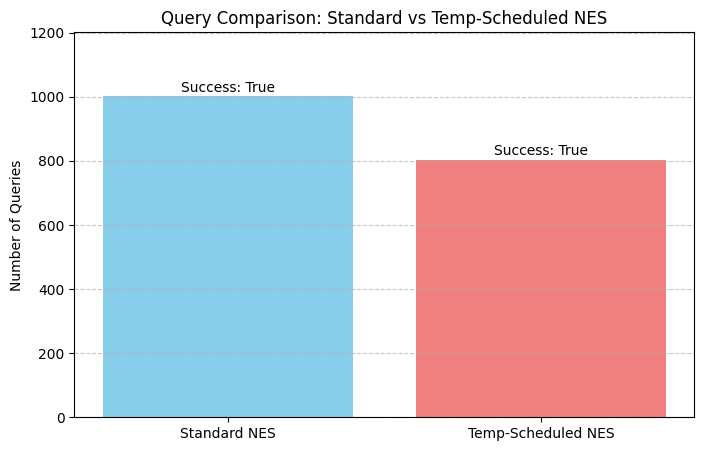

In [54]:
# Run Standard Query Limited Patchwise Attack
x_adv_std, success_std, queries_std = query_limited_attack_patchwise(
    x_orig=x_orig,
    target_label=target_label,
    epsilon=0.05,
    sigma=0.005,
    step_size=0.01,
    n_samples=1000,
    max_queries=1000,
    query_model_fn=query_model,
    patch_size=32
)

# Run Temperature-Scheduled Query Limited Patchwise Attack
x_adv_temp, success_temp, queries_temp = query_limited_attack_patchwise_temp(
    x_orig=x_orig,
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    sigma=0.005,
    step_size=0.01,
    n_samples=200,
    max_queries=1000,
    query_model_fn=query_model,
    patch_size=32
)

# Visualize Perturbations

visualize_patchwise_nocam_perturbation(
    x_orig=x_orig,
    x_adv=x_adv_std,
    patch_size=32,
    title="Standard NES Patchwise Attack"
)

visualize_patchwise_querylimited_temp(
    x_orig=x_orig,
    x_adv=x_adv_temp,
    patch_size=32,
    title="Temperature-Scheduled NES Patchwise Attack"
)

# Plot Query Comparison
def plot_query_comparison(queries_std, queries_temp, success_std, success_temp):
    import matplotlib.pyplot as plt

    labels = ["Standard NES", "Temp-Scheduled NES"]
    queries = [queries_std, queries_temp]
    success = [success_std, success_temp]

    colors = ['skyblue', 'lightcoral']

    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.bar(labels, queries, color=colors)

    for bar, succ in zip(bars, success):
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 5, f"Success: {succ}", ha='center', va='bottom', fontsize=10)

    ax.set_ylabel("Number of Queries")
    ax.set_title("Query Comparison: Standard vs Temp-Scheduled NES")
    plt.ylim(0, max(queries)*1.2)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Now call it
plot_query_comparison(queries_std, queries_temp, success_std, success_temp)


# The ieda of scheduled epsilon upgrade( along with grad cam and patchwise included) works well for partial info and label only settings with substantial decrease in number of queries

In [56]:
def partial_info_attack_patchwise_temp(
    x_orig, x_target, target_label, epsilon_init=1.0, epsilon_final=0.05,
    decay_rate=0.98, shrink_steps=100, sigma=0.005, step_size=0.01,
    n_samples=50, max_queries=2000, query_model_fn=None, topk=5,
    cam_mask=None, patch_size=32
):
    x_adv = x_target.clone().detach()
    epsilon = epsilon_init
    num_queries = 0

    for i in range(shrink_steps):
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()
        topk_preds = [topk_preds] if isinstance(topk_preds, int) else topk_preds
        num_queries += 1

        if target_label in topk_preds:
            direction = torch.sign(x_adv - x_orig)
            x_adv = x_adv - step_size * direction
            x_adv = clip(x_adv, x_orig, epsilon)
            epsilon = max(epsilon * decay_rate, epsilon_final)
        else:
            break

    def proxy_objective(x):
        preds = query_model_fn(x, return_probs=False).tolist()
        preds = preds[0] if isinstance(preds[0], list) else preds
        return topk - preds.index(target_label) if target_label in preds else 0

    for step in range(20):
        epsilon = temperature_schedule(step, 20, epsilon_init, epsilon_final)

        grad = nes_gradient_estimate_patchwise_weighted(
            x_adv, proxy_objective,
            cam_mask if cam_mask is not None else torch.ones_like(x_orig[:, :1]),
            patch_size, sigma, n_samples
        )

        num_queries += n_samples
        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon)

        preds = query_model_fn(x_adv, return_probs=False).tolist()
        preds = preds[0] if isinstance(preds[0], list) else preds
        num_queries += 1

        if target_label not in preds:
            return x_adv, False, num_queries

    return x_adv, True, num_queries


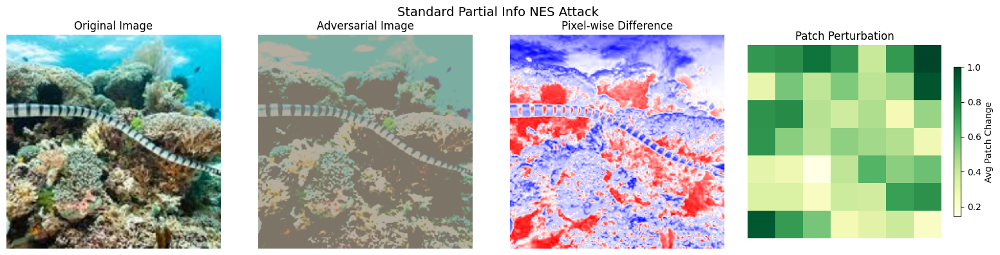

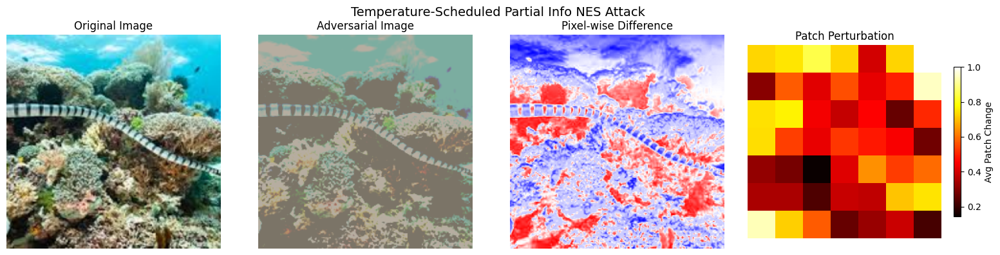

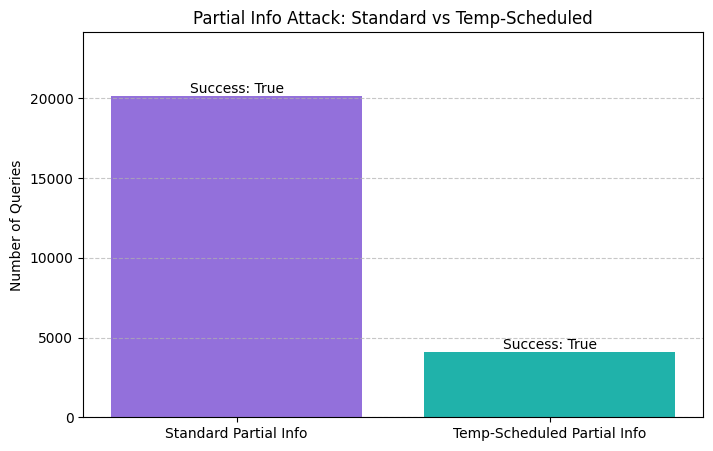

In [57]:
# Run Standard Partial Info Patchwise Attack
x_adv_std, success_std, queries_std = partial_info_attack_patchwise(
    x_orig=x_orig,
    x_target=x_target,
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=1000,
    max_queries=1000,
    query_model_fn=query_model,
    topk=5,
    patch_size=32
)

# Run Temp-Scheduled Partial Info Patchwise Attack
x_adv_temp, success_temp, queries_temp = partial_info_attack_patchwise_temp(
    x_orig=x_orig,
    x_target=x_target,
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=200,
    max_queries=1000,
    query_model_fn=query_model,
    topk=5,
    patch_size=32
)

# Visualize Perturbations

visualize_patchwise_nocam_perturbation(
    x_orig=x_orig,
    x_adv=x_adv_std,
    patch_size=32,
    title="Standard Partial Info NES Attack"
)

visualize_patchwise_querylimited_temp(
    x_orig=x_orig,
    x_adv=x_adv_temp,
    patch_size=32,
    title="Temperature-Scheduled Partial Info NES Attack"
)

# Plot Query Comparison
def plot_partialinfo_query_comparison(queries_std, queries_temp, success_std, success_temp):
    import matplotlib.pyplot as plt

    labels = ["Standard Partial Info", "Temp-Scheduled Partial Info"]
    queries = [queries_std, queries_temp]
    success = [success_std, success_temp]

    colors = ['mediumpurple', 'lightseagreen']

    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.bar(labels, queries, color=colors)

    for bar, succ in zip(bars, success):
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 5, f"Success: {succ}", ha='center', va='bottom', fontsize=10)

    ax.set_ylabel("Number of Queries")
    ax.set_title("Partial Info Attack: Standard vs Temp-Scheduled")
    plt.ylim(0, max(queries)*1.2)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Now call it
plot_partialinfo_query_comparison(queries_std, queries_temp, success_std, success_temp)


In [58]:
def label_only_attack_patchwise_temp(
    x_orig, x_target, target_label, epsilon_init=1.0, epsilon_final=0.05,
    decay_rate=0.98, shrink_steps=100, sigma=0.005, step_size=0.01,
    n_samples=50, max_queries=2000, query_model_fn=None, topk=5,
    cam_mask=None, patch_size=32
):
    x_adv = x_target.clone().detach()
    epsilon = epsilon_init
    num_queries = 0

    for i in range(shrink_steps):
        topk_preds = query_model_fn(x_adv, return_probs=False).tolist()
        if isinstance(topk_preds, int):
            topk_preds = [topk_preds]
        num_queries += 1

        if target_label in topk_preds:
            direction = torch.sign(x_adv - x_orig)
            x_adv = x_adv - step_size * direction
            x_adv = clip(x_adv, x_orig, epsilon)
            epsilon = max(epsilon * decay_rate, epsilon_final)
        else:
            break

    def proxy_objective(x):
        preds = query_model_fn(x, return_probs=False).tolist()
        if isinstance(preds, int):
            preds = [preds]
        return topk - preds.index(target_label) if target_label in preds else 0

    for step in range(20):
        epsilon = temperature_schedule(step, 20, epsilon_init, epsilon_final)

        grad = nes_gradient_estimate_patchwise_weighted(
            x_adv, proxy_objective,
            cam_mask if cam_mask is not None else torch.ones_like(x_orig[:, :1]),
            patch_size, sigma, n_samples
        )

        num_queries += n_samples
        x_adv = x_adv + step_size * torch.sign(grad)
        x_adv = clip(x_adv, x_orig, epsilon)

        preds = query_model_fn(x_adv, return_probs=False).tolist()
        if isinstance(preds, int):
            preds = [preds]
        num_queries += 1

        if target_label not in preds:
            return x_adv, False, num_queries

    return x_adv, True, num_queries


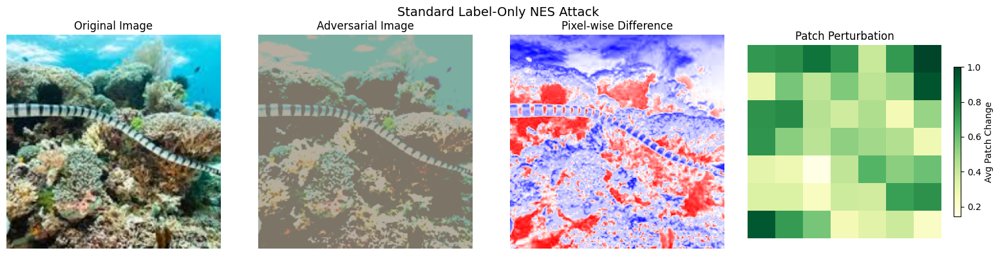

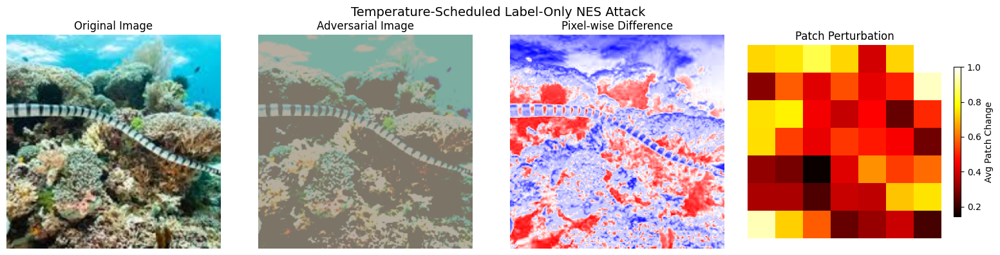

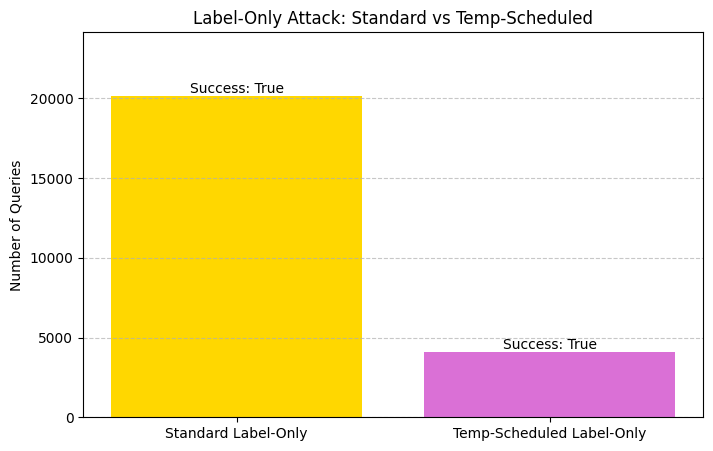

In [59]:
# Run Standard Label-Only Patchwise Attack
x_adv_std, success_std, queries_std = label_only_attack_patchwise(
    x_orig=x_orig,
    x_target=x_target,
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=1000,
    max_queries=1000,
    query_model_fn=query_model,
    topk=5,
    patch_size=32
)

# Run Temp-Scheduled Label-Only Patchwise Attack
x_adv_temp, success_temp, queries_temp = label_only_attack_patchwise_temp(
    x_orig=x_orig,
    x_target=x_target,
    target_label=target_label,
    epsilon_init=1.0,
    epsilon_final=0.05,
    decay_rate=0.98,
    shrink_steps=100,
    sigma=0.005,
    step_size=0.01,
    n_samples=200,
    max_queries=1000,
    query_model_fn=query_model,
    topk=5,
    patch_size=32
)

# Visualize Perturbations

visualize_patchwise_nocam_perturbation(
    x_orig=x_orig,
    x_adv=x_adv_std,
    patch_size=32,
    title="Standard Label-Only NES Attack"
)

visualize_patchwise_querylimited_temp(
    x_orig=x_orig,
    x_adv=x_adv_temp,
    patch_size=32,
    title="Temperature-Scheduled Label-Only NES Attack"
)

# Plot Query Comparison
def plot_labelonly_query_comparison(queries_std, queries_temp, success_std, success_temp):
    import matplotlib.pyplot as plt

    labels = ["Standard Label-Only", "Temp-Scheduled Label-Only"]
    queries = [queries_std, queries_temp]
    success = [success_std, success_temp]

    colors = ['gold', 'orchid']

    fig, ax = plt.subplots(figsize=(8, 5))
    bars = ax.bar(labels, queries, color=colors)

    for bar, succ in zip(bars, success):
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval + 5, f"Success: {succ}", ha='center', va='bottom', fontsize=10)

    ax.set_ylabel("Number of Queries")
    ax.set_title("Label-Only Attack: Standard vs Temp-Scheduled")
    plt.ylim(0, max(queries)*1.2)
    plt.grid(axis='y', linestyle='--', alpha=0.7)
    plt.show()

# Now call it
plot_labelonly_query_comparison(queries_std, queries_temp, success_std, success_temp)
